In [ ]:
import os, json, random, shutil
from pathlib import Path
from collections import Counter, defaultdict
from PIL import Image, ImageDraw

INPUT_ROOT = Path("/kaggle/input")
WORK       = Path("/kaggle/working")

YOUR_COCO_JSON = "/kaggle/input/datasets/vidishagar/pcb-large-coco/annotations/instances_default.json"   # e.g. Path("/kaggle/input/my-pcb/instances_default.json")
YOUR_IMG_ROOT  = "/kaggle/input/datasets/vidishagar/pcb-large-dataset/categories"   # eg. Path("/kaggle/input/my-pcb")   (searched recursively)
NEG_IMG_ROOT   = "/kaggle/input/datasets/vidishagar/non-def/non-def"   # e.g. Path("/kaggle/input/my-negatives")

# --- training knobs ---
MODEL           = "yolo11s.pt"   # SAME string for pretrain + both ablation arms
IMG_SIZE        = 640
SEED            = 42
VAL_FRAC        = 0.20
N_NEG_TOTAL     = 150
PRETRAIN_EPOCHS = 100
FINETUNE_EPOCHS = 150

IMAGE_EXTS = [".jpg",".jpeg",".png",".bmp",".JPG",".JPEG",".PNG",".BMP"]
random.seed(SEED)

In [ ]:
def find_image(folder_or_roots, name, recorded=None):
    roots = folder_or_roots if isinstance(folder_or_roots,(list,tuple)) else [folder_or_roots]
    base = Path(recorded).name if recorded else name
    for root in roots:
        cand = Path(root)/base
        if cand.exists():
            return cand
    for root in roots:
        for p in Path(root).rglob(Path(base).name):
            return p
    stem = Path(base).stem
    for root in roots:
        for ext in IMAGE_EXTS:
            for p in Path(root).rglob(stem+ext):
                return p
    return None

def polygon_area(pts):
    n=len(pts)
    if n<3: return 0.0
    s=0.0
    for i in range(n):
        x1,y1=pts[i]; x2,y2=pts[(i+1)%n]
        s+=x1*y2-x2*y1
    return abs(s)/2.0

def shape_to_polygon(shape):
    st=shape.get("shape_type","polygon"); pts=shape.get("points",[])
    if st=="polygon":
        return pts if len(pts)>=3 else None
    if st=="rectangle" and len(pts)==2:
        (x1,y1),(x2,y2)=pts
        xn,xx=min(x1,x2),max(x1,x2); yn,yx=min(y1,y2),max(y1,y2)
        return [[xn,yn],[xx,yn],[xx,yx],[xn,yx]]
    return None

def coco_bbox_to_yolo(b,W,H):
    x,y,w,h=b
    return (x+w/2)/W,(y+h/2)/H,w/W,h/H

def write_yolo_split(coco, ids, split, out_root, src_lookup, names):
    (out_root/f"images/{split}").mkdir(parents=True,exist_ok=True)
    (out_root/f"labels/{split}").mkdir(parents=True,exist_ok=True)
    cats=sorted(coco["categories"],key=lambda c:c["id"])
    cid2yolo={c["id"]:i for i,c in enumerate(cats)}
    byid={im["id"]:im for im in coco["images"]}
    anns=defaultdict(list)
    for a in coco["annotations"]: anns[a["image_id"]].append(a)
    ni=nb=0
    for i in ids:
        im=byid[i]; src=src_lookup(im["file_name"])
        if src is None: continue
        uniq = im["file_name"].replace("/","__").replace("\\","__")
        uniq_stem = Path(uniq).stem
        shutil.copy(src, out_root/f"images/{split}/{uniq}")
        W,H=im["width"],im["height"]; lines=[]
        for a in anns.get(i,[]):
            cx,cy,w,h=coco_bbox_to_yolo(a["bbox"],W,H)
            lines.append(f"{cid2yolo[a['category_id']]} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}")
            nb+=1
        (out_root/f"labels/{split}/{uniq_stem}.txt").write_text("\n".join(lines))
        ni+=1
    return ni,nb

def add_negatives(neg_paths, out_root, n_total, val_frac, seed=SEED):
    if not neg_paths:
        print("no negatives to add"); return
    negs=neg_paths[:]; random.Random(seed).shuffle(negs)
    negs=negs[:n_total]
    nval=round(n_total*val_frac)
    for split,chunk in (("val",negs[:nval]),("train",negs[nval:])):
        (out_root/f"images/{split}").mkdir(parents=True,exist_ok=True)
        (out_root/f"labels/{split}").mkdir(parents=True,exist_ok=True)
        for p in chunk:
            shutil.copy(p, out_root/f"images/{split}/{p.name}")
            (out_root/f"labels/{split}/{p.stem}.txt").write_text("")
    print(f"negatives added: {len(negs)-nval} train, {nval} val")

In [3]:
labeled_dirs=[p for p in INPUT_ROOT.rglob("Labeled") if p.is_dir()]
print("Found 'Labeled' folder(s):")
for p in labeled_dirs:
    nj=len(list(p.glob("*.json")))
    ni=len([f for f in p.iterdir() if f.suffix.lower() in (".jpg",".jpeg",".png",".bmp")])
    print(f"  {p}  ({nj} json, {ni} img)")
LABELED_DIR = labeled_dirs[0]
SOLDEF_ROOT = LABELED_DIR.parent
print("Using:", LABELED_DIR)

Found 'Labeled' folder(s):
  /kaggle/input/datasets/mauriziocalabrese/soldef-ai-pcb-dataset-for-defect-detection/SolDef_AI/Labeled  (428 json, 428 img)
Using: /kaggle/input/datasets/mauriziocalabrese/soldef-ai-pcb-dataset-for-defect-detection/SolDef_AI/Labeled


In [4]:
soldef_jsons=sorted(LABELED_DIR.rglob("*.json"))
lbl=Counter(); shp=Counter(); imgs_per=defaultdict(set)
for jp in soldef_jsons:
    try: data=json.loads(jp.read_text(encoding="utf-8"))
    except Exception: continue
    for sh in data.get("shapes",[]):
        lbl[sh.get("label","<none>")]+=1
        shp[sh.get("shape_type","polygon")]+=1
        imgs_per[sh.get("label","<none>")].add(jp.stem)
print("SolDef_AI labels:")
for k,c in lbl.most_common():
    print(f"  {k:<16}{c:>5} inst {len(imgs_per[k]):>5} img")
SOLDEF_CATS=sorted(lbl.keys())

SolDef_AI labels:
  good              186 inst   179 img
  exc_solder        182 inst   141 img
  spike             130 inst   114 img
  no_good           116 inst   116 img
  poor_solder        57 inst    51 img


In [5]:
cat_id={n:i+1 for i,n in enumerate(SOLDEF_CATS)}
soldef_coco={"images":[],"annotations":[],
    "categories":[{"id":i,"name":n} for n,i in cat_id.items()]}
iid=aid=0; miss=0
for jp in soldef_jsons:
    try: data=json.loads(jp.read_text(encoding="utf-8"))
    except Exception: continue
    ip=find_image(LABELED_DIR, jp.stem+".jpg", data.get("imagePath"))
    if ip is None: miss+=1; continue
    try:
        with Image.open(ip) as im: W,H=im.size
    except Exception:
        W,H=data.get("imageWidth"),data.get("imageHeight")
        if not(W and H): miss+=1; continue
    iid+=1
    soldef_coco["images"].append({"id":iid,"file_name":ip.name,"width":W,"height":H})
    for sh in data.get("shapes",[]):
        if sh.get("label") not in cat_id: continue
        poly=shape_to_polygon(sh)
        if poly is None: continue
        xs=[p[0] for p in poly]; ys=[p[1] for p in poly]
        bbox=[min(xs),min(ys),max(xs)-min(xs),max(ys)-min(ys)]
        aid+=1
        soldef_coco["annotations"].append({"id":aid,"image_id":iid,
            "category_id":cat_id[sh["label"]],
            "segmentation":[[c for p in poly for c in p]],
            "bbox":[round(v,2) for v in bbox],"area":round(polygon_area(poly),2),
            "iscrowd":0})
(WORK/"soldef_coco.json").write_text(json.dumps(soldef_coco))
print(f"SolDef COCO: {len(soldef_coco['images'])} imgs, "
      f"{len(soldef_coco['annotations'])} anns, {miss} missing imgs")

SolDef COCO: 428 imgs, 671 anns, 0 missing imgs


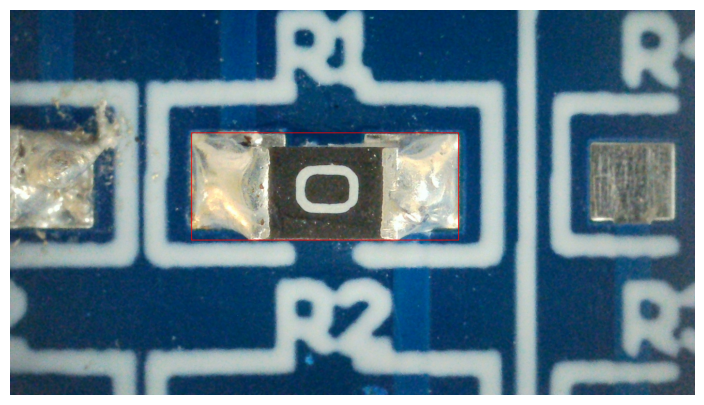

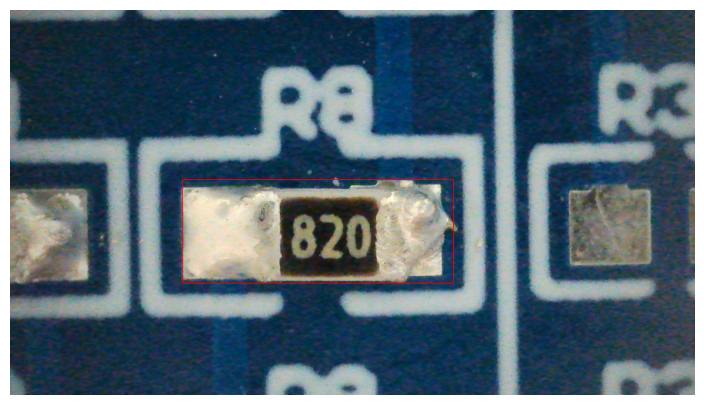

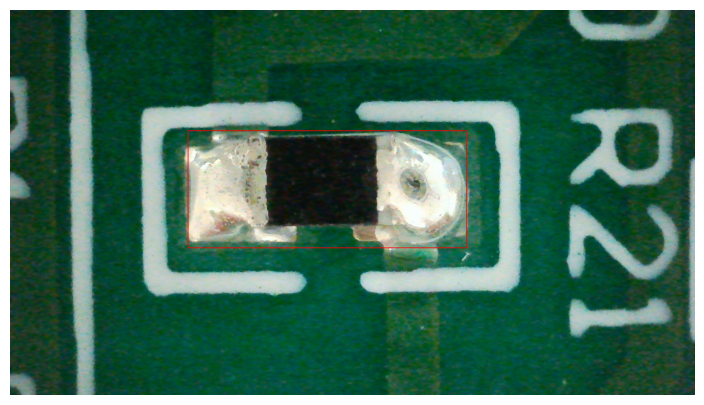

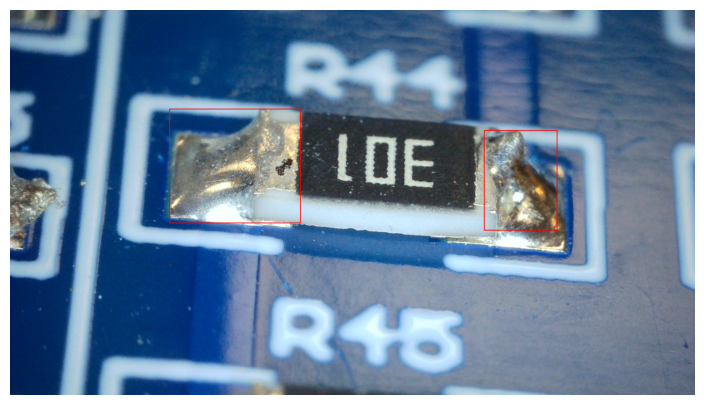

In [6]:
import matplotlib.pyplot as plt
src_by_name={p.name:p for p in SOLDEF_ROOT.rglob("*.jpg")}
imgs_by_id={im["id"]:im for im in soldef_coco["images"]}
anns_by_img=defaultdict(list)
for a in soldef_coco["annotations"]: anns_by_img[a["image_id"]].append(a)
picks=list(imgs_by_id.values())[::max(1,len(imgs_by_id)//4)][:4]
for im in picks:
    p=src_by_name.get(im["file_name"])
    if not p: continue
    pic=Image.open(p).convert("RGB"); d=ImageDraw.Draw(pic)
    for a in anns_by_img[im["id"]]:
        x,y,w,h=a["bbox"]; d.rectangle([x,y,x+w,y+h],outline=(255,0,0),width=3)
    plt.figure(figsize=(9,5)); plt.imshow(pic); plt.axis("off"); plt.show()

In [7]:
import yaml
fname_board={}
for img in SOLDEF_ROOT.rglob("*.jpg"):
    b=next((p for p in img.parts if p.upper().startswith("CS") and p[2:].isdigit()),None)
    if b: fname_board[img.name]=b
by_board=defaultdict(list)
for im in soldef_coco["images"]:
    by_board[fname_board.get(im["file_name"],"UNK")].append(im["id"])
boards=sorted(b for b in by_board if b!="UNK")
random.Random(SEED).shuffle(boards)
n_val=max(1,round(len(boards)*VAL_FRAC))
val_boards=set(boards[:n_val])
s_train={i for b in boards[n_val:] for i in by_board[b]} | set(by_board.get("UNK",[]))
s_val  ={i for b in val_boards   for i in by_board[b]}
print("SolDef val boards:",sorted(val_boards),"| train",len(s_train),"val",len(s_val))

SOLDEF_YOLO=WORK/"soldef_yolo"
sl=lambda n: src_by_name.get(n)
soldef_names=[c["name"] for c in sorted(soldef_coco["categories"],key=lambda c:c["id"])]
print("train:",write_yolo_split(soldef_coco,s_train,"train",SOLDEF_YOLO,sl,soldef_names))
print("val  :",write_yolo_split(soldef_coco,s_val,  "val",  SOLDEF_YOLO,sl,soldef_names))
(SOLDEF_YOLO/"data.yaml").write_text(yaml.safe_dump(
    {"path":str(SOLDEF_YOLO),"train":"images/train","val":"images/val",
     "names":{i:n for i,n in enumerate(soldef_names)}},sort_keys=False))
print("SolDef classes:",soldef_names)

SolDef val boards: ['CS4'] | train 388 val 40
train: (388, 631)
val  : (40, 40)
SolDef classes: ['exc_solder', 'good', 'no_good', 'poor_solder', 'spike']


In [8]:
!pip install ultralytics

In [9]:
from ultralytics import YOLO
pt=YOLO(MODEL)
pt.train(data=str(SOLDEF_YOLO/"data.yaml"),epochs=PRETRAIN_EPOCHS,imgsz=IMG_SIZE,
    batch=16,patience=20,project=str(WORK/"runs"),name="pretrain_soldef",
    hsv_h=0.015,hsv_s=0.7,hsv_v=0.4,degrees=15,shear=10,scale=0.5,
    fliplr=0.5,flipud=0.5,mosaic=1.0,seed=SEED)
PRETRAINED=str(WORK/"runs/pretrain_soldef/weights/best.pt")
print("pretrained ->",PRETRAINED)

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/soldef_yolo/data.yaml, degrees=15, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=pretrain_soldef-2, nbs=64, nms=False, opset=None, optimize=False, optimizer=a

In [ ]:
def auto_find(patterns, roots=(INPUT_ROOT,)):
    hits=[]
    for r in roots:
        for pat in patterns:
            hits += list(Path(r).rglob(pat))
    return hits

if YOUR_COCO_JSON is None:
    cands=[p for p in auto_find(["*.json"]) if "Labeled" not in str(p)
           and "soldef" not in p.name.lower()]
    for c in cands:
        try:
            d=json.loads(c.read_text())
            if "annotations" in d and "categories" in d:
                YOUR_COCO_JSON=c; break
        except Exception: pass
print("YOUR_COCO_JSON =", YOUR_COCO_JSON)
assert YOUR_COCO_JSON, "Set YOUR_COCO_JSON in CELL 0."

your_coco=json.loads(Path(YOUR_COCO_JSON).read_text())
YOUR_NAMES=[c["name"] for c in sorted(your_coco["categories"],key=lambda c:c["id"])]
print(f"{len(YOUR_NAMES)} classes:",YOUR_NAMES)

if YOUR_IMG_ROOT is None:
    YOUR_IMG_ROOT=Path(YOUR_COCO_JSON).parent

IMG_BASE = Path(YOUR_IMG_ROOT).parent
your_src = {}
for p in Path(YOUR_IMG_ROOT).rglob("*"):
    if p.suffix.lower() in (".jpg",".jpeg",".png",".bmp"):
        rel = str(p.relative_to(IMG_BASE))
        your_src[rel] = p
print("your images found:", len(your_src))

_basename_index = defaultdict(list)
for k,v in your_src.items():
    _basename_index[Path(k).name].append(v)

def resolve_your_image(file_name):
    if file_name in your_src:
        return your_src[file_name]
    hits = _basename_index.get(Path(file_name).name, [])
    return hits[0] if len(hits)==1 else None

found = sum(1 for im in your_coco["images"] if resolve_your_image(im["file_name"]))
print(f"COCO images resolvable: {found} / {len(your_coco['images'])}")
assert found >= len(your_coco["images"]) * 0.98, \
    "Under 98% resolvable — some COCO file_names don't match files on disk."

# negatives
if NEG_IMG_ROOT is None:
    for r in (INPUT_ROOT.iterdir() if INPUT_ROOT.exists() else []):
        if any(k in r.name.lower() for k in ("neg","good","defect-free","clean","ok")):
            NEG_IMG_ROOT=r; break
neg_files=[]
if NEG_IMG_ROOT:
    neg_files=[p for p in Path(NEG_IMG_ROOT).rglob("*")
               if p.suffix.lower() in (".jpg",".jpeg",".png",".bmp")]
print("negatives available:",len(neg_files),"from",NEG_IMG_ROOT)

YOUR_COCO_JSON = /kaggle/input/datasets/vidishagar/pcb-large-coco/annotations/instances_default.json
12 classes: ['Component Crack', 'Component Damage', 'Component Liftup', 'Component Missing', 'Component No Solder', 'Component Solder Dry', 'LED Damage', 'Polarity Wrong', 'RYB Wrong Sequence', 'Solder Ball', 'Solder Short', 'Tombstone']
your images found: 551
COCO images resolvable: 548 / 551
negatives available: 150 from /kaggle/input/datasets/vidishagar/non-def/non-def


In [11]:
cls_freq=Counter(a["category_id"] for a in your_coco["annotations"])
img_cls=defaultdict(set)
for a in your_coco["annotations"]: img_cls[a["image_id"]].add(a["category_id"])
strat=defaultdict(list)
for im in your_coco["images"]:
    cls=img_cls.get(im["id"],set())
    key=min(cls,key=lambda c:cls_freq[c]) if cls else "__none__"
    strat[key].append(im["id"])
rng=random.Random(SEED); y_train=set(); y_val=set()
for k,ids in strat.items():
    ids=ids[:]; rng.shuffle(ids)
    nv=max(1,round(len(ids)*VAL_FRAC)) if len(ids)>1 else 0
    y_val|=set(ids[:nv]); y_train|=set(ids[nv:])
assert not (y_train & y_val)
print(f"train {len(y_train)} imgs | val {len(y_val)} imgs")
for c in sorted(cls_freq):
    ntr=sum(1 for a in your_coco["annotations"] if a["category_id"]==c and a["image_id"] in y_train)
    nva=sum(1 for a in your_coco["annotations"] if a["category_id"]==c and a["image_id"] in y_val)
    nm=next(x["name"] for x in your_coco["categories"] if x["id"]==c)
    print(f"  {nm:<22} train {ntr:>3} val {nva:>3}")

train 441 imgs | val 110 imgs
  Component Crack        train   6 val   2
  Component Damage       train   7 val   2
  Component Liftup       train  18 val   4
  Component Missing      train  35 val   9
  Component No Solder    train  95 val  19
  Component Solder Dry   train 113 val  25
  LED Damage             train   6 val   1
  Polarity Wrong         train  29 val   7
  RYB Wrong Sequence     train  19 val   5
  Solder Ball            train  35 val   8
  Solder Short           train 115 val  29
  Tombstone              train  12 val   3


In [12]:
YOUR_YOLO=WORK/"your_yolo"
ysl = lambda n: resolve_your_image(n)
print("positives train:",write_yolo_split(your_coco,y_train,"train",YOUR_YOLO,ysl,YOUR_NAMES))
print("positives val  :",write_yolo_split(your_coco,y_val,  "val",  YOUR_YOLO,ysl,YOUR_NAMES))
add_negatives(neg_files, YOUR_YOLO, N_NEG_TOTAL, VAL_FRAC)
(YOUR_YOLO/"data.yaml").write_text(yaml.safe_dump(
    {"path":str(YOUR_YOLO),"train":"images/train","val":"images/val",
     "names":{i:n for i,n in enumerate(YOUR_NAMES)}},sort_keys=False))
print("your data.yaml written; classes:",YOUR_NAMES)

positives train: (440, 488)
positives val  : (108, 111)
negatives added: 120 train, 30 val
your data.yaml written; classes: ['Component Crack', 'Component Damage', 'Component Liftup', 'Component Missing', 'Component No Solder', 'Component Solder Dry', 'LED Damage', 'Polarity Wrong', 'RYB Wrong Sequence', 'Solder Ball', 'Solder Short', 'Tombstone']


In [13]:
def finetune(init_weights, run_name):
    m=YOLO(init_weights)
    m.train(data=str(YOUR_YOLO/"data.yaml"),epochs=FINETUNE_EPOCHS,imgsz=IMG_SIZE,
        batch=16,patience=30,project=str(WORK/"runs"),name=run_name,
        freeze=10,lr0=0.001,
        hsv_h=0.015,hsv_s=0.7,hsv_v=0.4,degrees=15,shear=10,scale=0.5,
        fliplr=0.5,flipud=0.5,mosaic=1.0,copy_paste=0.3,seed=SEED)
    return m

model_A=finetune(MODEL,      "finetune_A_baseline")     # ImageNet/COCO init
model_B=finetune(PRETRAINED, "finetune_B_pretrained")   # SolDef_AI init

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/your_yolo/data.yaml, degrees=15, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=10, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=finetune_A_baseline, nbs=64, nms=False, opset=None, optimize=False, optimizer=au

In [14]:
rA=model_A.val(data=str(YOUR_YOLO/"data.yaml"),split="val")
rB=model_B.val(data=str(YOUR_YOLO/"data.yaml"),split="val")
print("\n============ A (no pretrain) vs B (SolDef_AI pretrain) ============")
print(f"mAP@0.5       A {rA.box.map50:.4f}  B {rB.box.map50:.4f}  d {rB.box.map50-rA.box.map50:+.4f}")
print(f"mAP@0.5:0.95  A {rA.box.map:.4f}  B {rB.box.map:.4f}  d {rB.box.map-rA.box.map:+.4f}")
print("\nper-class mAP@0.5 (watch the rare classes):")
for i,n in rA.names.items():
    a=rA.box.maps[i] if i<len(rA.box.maps) else 0
    b=rB.box.maps[i] if i<len(rB.box.maps) else 0
    print(f"  {n:<22} A {a:.3f}  B {b:.3f}  d {b-a:+.3f}")
print("\nNOTE: stratified-random split (no board id) -> numbers may be mildly")
print("optimistic vs a board-held-out split. State this in the write-up.")

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
YOLO11s summary (fused): 101 layers, 9,417,444 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2642.2±230.4 MB/s, size: 291.6 KB)
val: Scanning /kaggle/working/your_yolo/labels/val.cache... 138 images, 31 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 138/138 41.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 4.3it/s 2.1s0.2s
                   all        138        111      0.807      0.645      0.733      0.469
       Component Crack          2          2      0.769          1      0.995      0.401
      Component Damage          2          2          1          0      0.109     0.0399
      Component Liftup          4          4          1      0.472      0.682      0.423
     Component Missing          9          9          1      0.869      0.961      0.538
   Component No Solder         15 

In [15]:
!git clone https://github.com/rigvedrs/YOLO-26-CAM.git 2>/dev/null
import sys
sys.path.insert(0, "/kaggle/working/YOLO-26-CAM")
!pip install grad-cam --quiet
print("YOLO-CAM ready")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 22.3 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
YOLO-CAM ready


In [ ]:
import numpy as np, cv2, torch, matplotlib.pyplot as plt
from pathlib import Path
from ultralytics import YOLO
from yolo_cam.eigen_cam import EigenCAM
from yolo_cam.utils.image import show_cam_on_image

# your two trained models
A_WEIGHTS = str(WORK/"runs/finetune_A_baseline/weights/best.pt")
B_WEIGHTS = str(WORK/"runs/finetune_B_pretrained/weights/best.pt")

model_A_cam = YOLO(A_WEIGHTS)
model_B_cam = YOLO(B_WEIGHTS)

# target layer: a late backbone layer works best for both.
# model.model.model is the layer list; -2 / -3 are common choices.
def get_target_layers(m):
    return [m.model.model[-3]]   # try -2, -3, -4 if maps look off

val_img_dir = WORK/"your_yolo/images/val"
sample_imgs = sorted([p for p in val_img_dir.glob("*")
                      if p.suffix.lower() in (".jpg",".jpeg",".png")])[35:45]
print("inspecting:", [p.name for p in sample_imgs])

inspecting: ['categories__Component Liftup__J2 connector lift up (1).jpg', 'categories__Component Liftup__J2 connector lift up.jpg', 'categories__Component Liftup__Liftup (2).jpg', 'categories__Component Liftup__component missing.jpg', 'categories__Component Missing__D12 MISSING.jpg', 'categories__Component Missing__D14 missing.jpg', 'categories__Component Missing__D3 MISSING.jpg', 'categories__Component Missing__D49 LED MISSING (1).jpg', 'categories__Component Missing__J10 Missing.jpg', 'categories__Component Missing__J6 connector missing.jpg']



0: 640x640 (no detections), 16.1ms
Speed: 4.0ms preprocess, 16.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 15.9ms
Speed: 3.8ms preprocess, 15.9ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


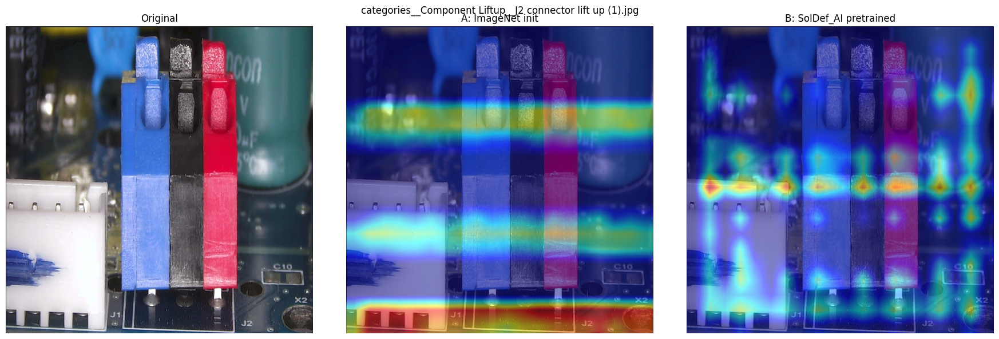


0: 640x640 (no detections), 16.0ms
Speed: 4.1ms preprocess, 16.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.2ms
Speed: 3.5ms preprocess, 16.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


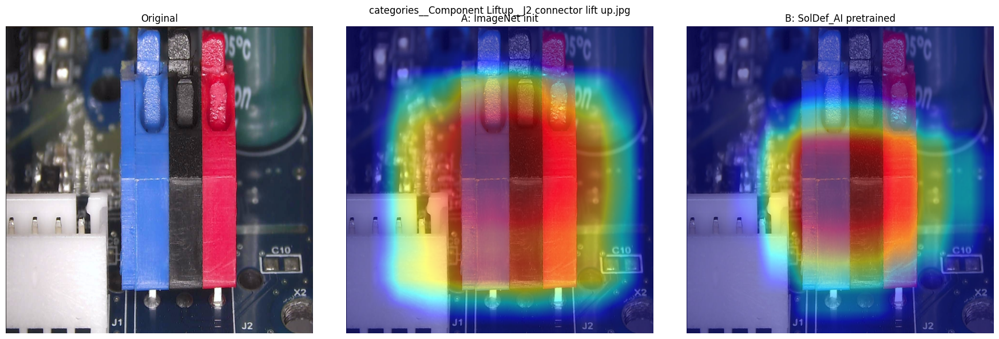


0: 640x640 (no detections), 16.0ms
Speed: 4.0ms preprocess, 16.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.2ms
Speed: 3.3ms preprocess, 16.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


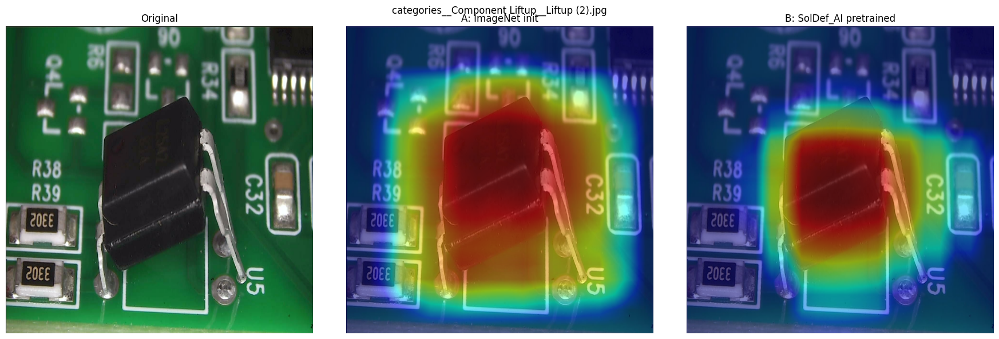


0: 640x640 (no detections), 16.1ms
Speed: 4.0ms preprocess, 16.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.1ms
Speed: 3.5ms preprocess, 16.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


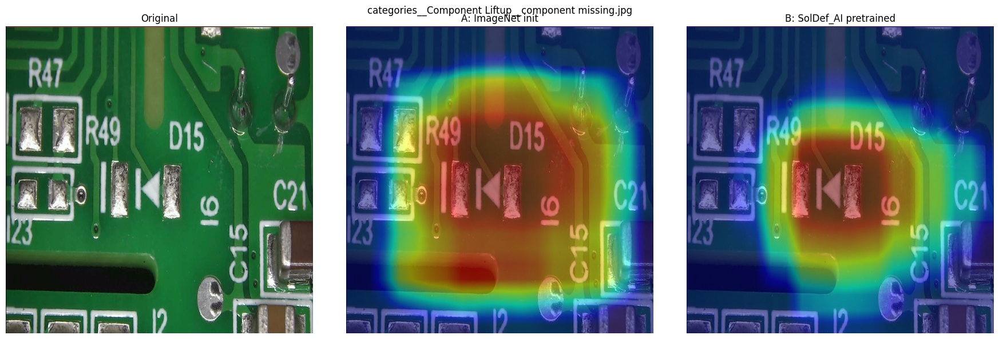


0: 640x640 (no detections), 16.0ms
Speed: 3.8ms preprocess, 16.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.0ms
Speed: 3.2ms preprocess, 16.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


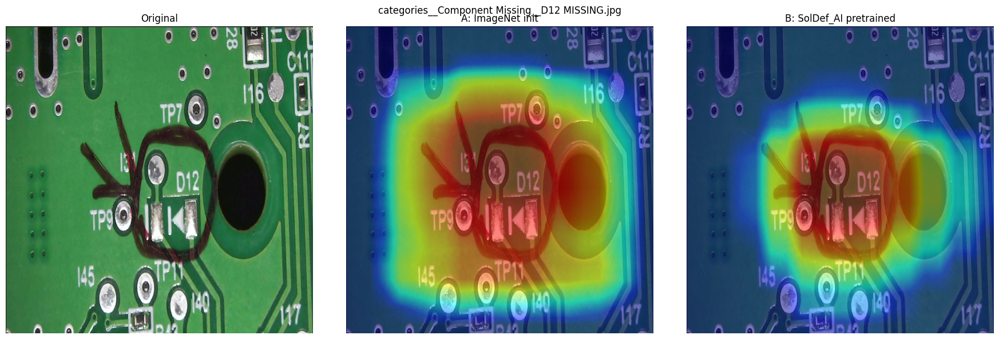


0: 640x640 (no detections), 16.0ms
Speed: 4.3ms preprocess, 16.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.3ms
Speed: 3.1ms preprocess, 16.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


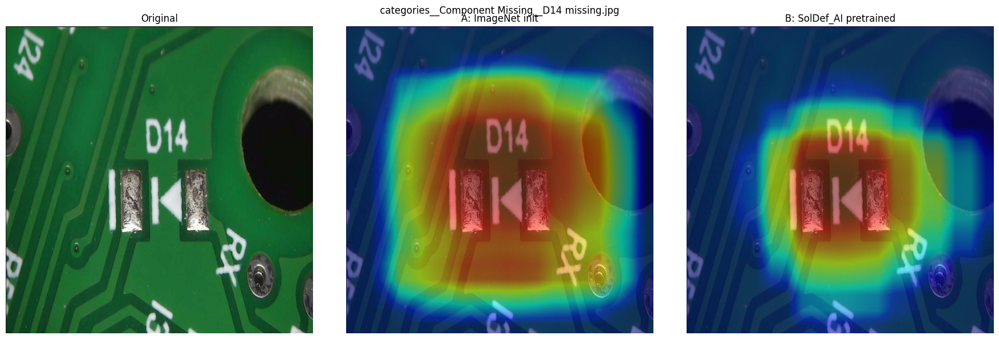


0: 640x640 (no detections), 16.1ms
Speed: 5.5ms preprocess, 16.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.1ms
Speed: 3.7ms preprocess, 16.1ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


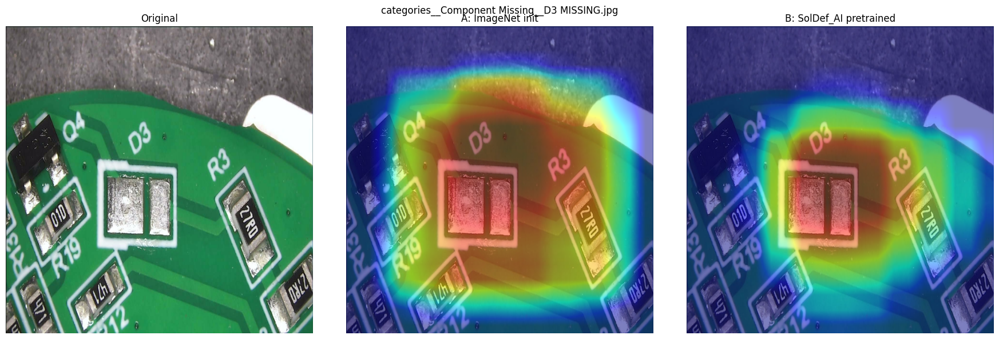


0: 640x640 (no detections), 16.0ms
Speed: 3.8ms preprocess, 16.0ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.2ms
Speed: 3.4ms preprocess, 16.2ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


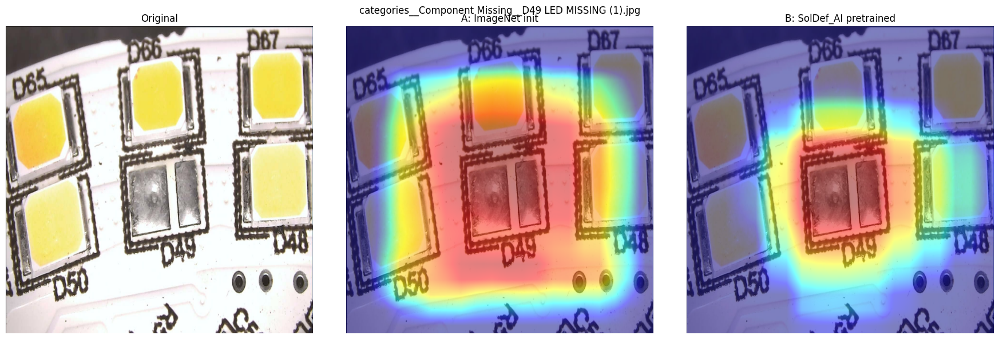


0: 640x640 (no detections), 16.0ms
Speed: 4.1ms preprocess, 16.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 16.1ms
Speed: 3.7ms preprocess, 16.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
def cam_for(model, target_layers, rgb_float, img_bgr):
    cam = EigenCAM(model, target_layers, task="od")   # od = object detection
    grayscale = cam(rgb_float)[0, :, :]
    return show_cam_on_image(rgb_float, grayscale, use_rgb=True)

for p in sample_imgs:
    img = cv2.imread(str(p))
    img = cv2.resize(img, (640, 640))
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    rgb_float = np.float32(rgb) / 255.0

    cam_A = cam_for(model_A_cam, get_target_layers(model_A_cam), rgb_float, img)
    cam_B = cam_for(model_B_cam, get_target_layers(model_B_cam), rgb_float, img)

    fig, ax = plt.subplots(1, 3, figsize=(18, 6))
    ax[0].imshow(rgb);   ax[0].set_title("Original");                 ax[0].axis("off")
    ax[1].imshow(cam_A); ax[1].set_title("A: ImageNet init");         ax[1].axis("off")
    ax[2].imshow(cam_B); ax[2].set_title("B: SolDef_AI pretrained");  ax[2].axis("off")
    fig.suptitle(p.name, fontsize=12)
    plt.tight_layout(); plt.show()

In [ ]:
import shutil
from pathlib import Path

# separate output folder so your negatives run is preserved for comparison
YOUR_YOLO_NONEG = WORK/"your_yolo_noneg"
shutil.rmtree(YOUR_YOLO_NONEG, ignore_errors=True)

# reuse the SAME split (y_train / y_val) so the ONLY difference is negatives.
# this keeps the comparison clean — same images, same split, just no empties added.
ysl = lambda n: resolve_your_image(n)
print("positives train:", write_yolo_split(your_coco, y_train, "train", YOUR_YOLO_NONEG, ysl, YOUR_NAMES))
print("positives val  :", write_yolo_split(your_coco, y_val,   "val",   YOUR_YOLO_NONEG, ysl, YOUR_NAMES))

# NOTE: deliberately NOT calling add_negatives() here.

import yaml
(YOUR_YOLO_NONEG/"data.yaml").write_text(yaml.safe_dump(
    {"path":str(YOUR_YOLO_NONEG),"train":"images/train","val":"images/val",
     "names":{i:n for i,n in enumerate(YOUR_NAMES)}}, sort_keys=False))
print("defect-only data.yaml written; classes:", YOUR_NAMES)

In [ ]:
YR = YOUR_YOLO_NONEG
for split in ["train","val"]:
    imgs=[p for p in (YR/f"images/{split}").rglob("*") if p.suffix.lower() in (".jpg",".jpeg",".png",".bmp")]
    labs=list((YR/f"labels/{split}").rglob("*.txt"))
    empty=[p for p in labs if not p.read_text().strip()]
    print(f"[{split}] images={len(imgs)} labels={len(labs)} EMPTY_labels={len(empty)}")
# EMPTY_labels should be 0 or near-0 here (every image has a defect)

In [20]:
from ultralytics import YOLO

def finetune_noneg(init_weights, run_name):
    m = YOLO(init_weights)
    m.train(data=str(YOUR_YOLO_NONEG/"data.yaml"), epochs=FINETUNE_EPOCHS, imgsz=IMG_SIZE,
        batch=16, patience=30, project=str(WORK/"runs"), name=run_name,
        freeze=10, lr0=0.001,
        hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=15, shear=10, scale=0.5,
        fliplr=0.5, flipud=0.5, mosaic=1.0, copy_paste=0.3, seed=SEED)
    return m

model_A_noneg = finetune_noneg(MODEL,      "finetune_A_noneg")     # ImageNet init
model_B_noneg = finetune_noneg(PRETRAINED, "finetune_B_noneg")     # SolDef_AI init

     13/150      2.88G      1.446      1.419        1.4         20        640: 100% ━━━━━━━━━━━━ 28/28 5.7it/s 5.0s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.6it/s 0.9s0.4s
                   all        108        111      0.605      0.535      0.649      0.395

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     14/150      2.88G      1.412       1.36      1.425         25        640: 100% ━━━━━━━━━━━━ 28/28 5.5it/s 5.1s0.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s0.3s
                   all        108        111      0.735      0.487      0.594       0.37

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
     15/150      2.88G      1.431      1.365      1.402         20        640: 100% ━━━━━━━━━━━━ 28/28 5.5it/s 5.1s0.2s
                 Class     Images  Instances  

KeyboardInterrupt: 

In [ ]:
rA = model_A_noneg.val(data=str(YOUR_YOLO_NONEG/"data.yaml"), split="val")
rB = model_B_noneg.val(data=str(YOUR_YOLO_NONEG/"data.yaml"), split="val")

print("\n===== DEFECT-ONLY (no negatives) : A vs B =====")
print(f"mAP@0.5       A {rA.box.map50:.4f}  B {rB.box.map50:.4f}  d {rB.box.map50-rA.box.map50:+.4f}")
print(f"mAP@0.5:0.95  A {rA.box.map:.4f}  B {rB.box.map:.4f}  d {rB.box.map-rA.box.map:+.4f}")
print("\nper-class mAP@0.5:")
for i,n in rA.names.items():
    a=rA.box.maps[i] if i<len(rA.box.maps) else 0
    b=rB.box.maps[i] if i<len(rB.box.maps) else 0
    print(f"  {n:<22} A {a:.3f}  B {b:.3f}  d {b-a:+.3f}")

print("\n--- reminder for interpretation ---")
print("Higher mAP here vs the negatives run does NOT prove negatives hurt.")
print("This val set is all-defect, so it can't measure false positives on")
print("clean patches (the thing negatives fix). Compare with caution.")